# Demo of EKF with Two-Stage Model

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

### Two-stage model functions

This defines the bed of the Glacier given the paramter of slope, start point and reverse slope.

In [3]:
def bedtopo(L,*args):  #bed to topography L- length of glacier
    b0 = args[0]   #b0: glacier start point
    bx = args[1]   #bx: glacier slope
    sillmin = args[2]   #start of reverse slope
    sillmax = args[3]   #end of reverse slope
    sillslope = args[4]   #slope of reverse slope
    
    if L < sillmin: #if glacier is shorter than reverse slope
        b = b0 + bx*L
    elif L < sillmax: #if glacier terminates on reverse slope
        b = b0 + bx*sillmin + sillslope*(L-sillmin)
    else: #if glacier terminates after reverse slope
        b = b0 + bx*sillmin + sillslope*(sillmax-sillmin) + bx*(L-sillmax)
        
    return b

This function defines the model of the Glacier we are working with. The differential equations used are defined below in mathematical terms to help bring clarity to the code. 

In [4]:
def TwoStage_timedep(state,*args): #Robel et al. 2018 two-stage model
    
    Hnd, Lnd = state #Unpack the state vector, Hnd n-dim thickness
    #Lnd n-dim length
    f = np.zeros(2) #Derivatives
    
    smb0 = args[0] #P (precipitation) at time 0
    smb1 = args[1] #P (precipitation) at time 1
    smbf = args[2] #P (precipitation) at time f
    gamma = args[3] #Q coefficient
    omega = args[4] #Q_g coefficient
    time = args[5]
    t1 = args[6]
    tfinal = args[7]
#    b0 = args[3]
#    bx = args[4]
#    sillmin = args[5]
#    sillmax = args[6]
#    sillslope = args[7]

    b0 = 0   #glacier start point
    bx = -0.001   #glacier slope
    sillmin = 415e3   #reverse slope start point
    sillmax = 425e3   #reverse slope ends point
    sillslope = -0.02   #reverse slope slope
    
    rhow = 1028   #density of water
    rhoi = 917   #denisty of ice
    n = 3   
    beta = 4.75   
    Lscale = 100e3   #scale for length, it is on the order of 10E4 or 1E5
    Hscale = 1000   #scale for thickness, it is on the order of 10E2 or 1E3
    
    H = Hnd*Hscale #icethickness
    L = Lnd*Lscale #length of glacier
    
    if time < t1:
        smb = smb0 + (smb1-smb0)*time/t1
    else:
        smb = smb1 + (smbf-smb1)*time/(tfinal-t1) 
    #see below for write out of the functions in mathematical notation
    hg = -(rhow/rhoi)*bedtopo(L,b0,bx,sillmin,sillmax,sillslope)   # #1
    Q = gamma * (H**(2*n + 1))/(L**n)   # #2
    Qg = omega * (hg**beta)   # #3
    
    f[0] = (smb - (Qg/L) - (H/(hg*L))*(Q-Qg))/Hscale   # #4
    f[1] = (Q-Qg)/hg/Lscale   # #5
    return f 

$\#1$ $h_g = \dfrac{\rho_w}{\rho_i}b(L)$

$\#2$ $Q=\gamma \dfrac{H^{2n+1}}{L^n}$

$\#3$ $Q_g= \Omega h_g^\beta$

$\#4$ $\dfrac{dh}{dt}=P-\dfrac{Q_g}{L}-\dfrac{H}{h_gL}(Q-Q_g)$

$\#5$ $\dfrac{dL}{dt}=\dfrac{1}{h_g}(Q-Q_g) $ Note: You can factor out scalars of a derivative, that is why it is able to be divide by the scale of L.

### Time Integrator function

This function defines and runs a 4th Order Runge Kutta Method.

In [5]:
def RK4(rhs,state,dt,*args): #ask for explanation
    
    k1 = rhs(state,*args)
    k2 = rhs(state+k1*dt/2,*args)
    k3 = rhs(state+k2*dt/2,*args)
    k4 = rhs(state+k3*dt,*args)

    new_state = state + (dt/6)*(k1+2*k2+2*k3+k4)
    return new_state

### EKF functions

This function runs the Ensemble Kalman Filter.

In [6]:
def EnKF(ubi,w,ObsOp,JObsOp,R,B):
    
    # The analysis step for the (stochastic) ensemble Kalman filter 
    # with virtual observations

    n,N = ubi.shape # n is the state dimension and N is the size of ensemble
    m = w.shape[0] # m is the size of measurement vector

    # compute the mean of forecast ensemble
    ub = np.mean(ubi,1)
    # compute Jacobian of observation operator at ub
    Dh = JObsOp(w)
    # compute Kalman gain
    D = Dh@B@Dh.T + R #@ is matrix multiplication
    K = B @ Dh.T @ np.linalg.inv(D)
        
    
    wi = np.zeros([m,N])
    uai = np.zeros([n,N])
    for i in range(N):
        # create virtual observations
        wi[:,i] = w + np.random.multivariate_normal(np.zeros(m), R)
        # compute analysis ensemble
        uai[:,i] = ubi[:,i] + K @ (wi[:,i]-ObsOp(ubi[:,i]))
        
    # compute the mean of analysis ensemble
    ua = np.mean(uai,1)    
    # compute analysis error covariance matrix
    P = (1/(N-1)) * (uai - ua.reshape(-1,1)) @ (uai - ua.reshape(-1,1)).T
    return uai, P

Defines the observation operators we will be using.

In [7]:
# Observation operators
def h(u):   #identity oberservation operator?
    w = u
    return w

def Dh(u):   #identity operator for matrix of size Dh
    n = len(u)
    D = np.eye(n)
    return D

## Set parameters

Sets model intialization parameters except for length of glacier, glacier bed parameters and reverse slope parameters.

[[0,0,0, 0,1950,2300], %steady smb
[0.3,0.3,0.3, 0,1950,2300], %steady smb
[0,0.15,0.3, 0,1150,2300], %positive linear smb
[0.15,0,-0.15, 0,1150,2300], %negative linear smb
[0.15,0,0.15, 0,1950,2300], %u-shaped smb

[0.15,-0.15,0.15, 0,1950,2300], %more extreme u-shape smb
[0,0.15,0.3,  0,1950,2300], % slope up smb
[0,0.15,0.5, 0,1950,2300], % more extreme slope up smb
[0,-0.15,-0.3,  0,1950,2300], % slope down smb
[0,-0.15,-0.5, 0,1950,2300]] % more extreme slope down smb

In [14]:
smb_t0 = [0]
smb_t1 = [1950]
smb_tf = [2300]
smb_0d = [-0.5, -0.3, -0.15, 0, 0.15, 0.3, 0.5]
smb_1d = [-0.5, -0.3, -0.15, 0, 0.15, 0.3, 0.5]
smb_fd = [-0.5, -0.3, -0.15, 0, 0.15, 0.3, 0.5]
arr=np.zeros((1,1,1,7,7,7),dtype=list)
for l in range(len(smb_0d)):
    for m in range(len(smb_1d)):
        for n in range(len(smb_fd)):
            #note that the number of brackets denotes corresponds to
            #the number of dimensions
            arr[0][0][0][l][m][n]=[smb_t0[0],smb_t1[0],smb_tf[0],smb_0d[l],smb_1d[m],smb_fd[n]]

/var/folders/n0/rsxpkn6j2xv8hrpk19m6_r6m0000gn/T/ipykernel_2383/3598761264.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(nrows=nd,ncols=1, figsize=(10,8))


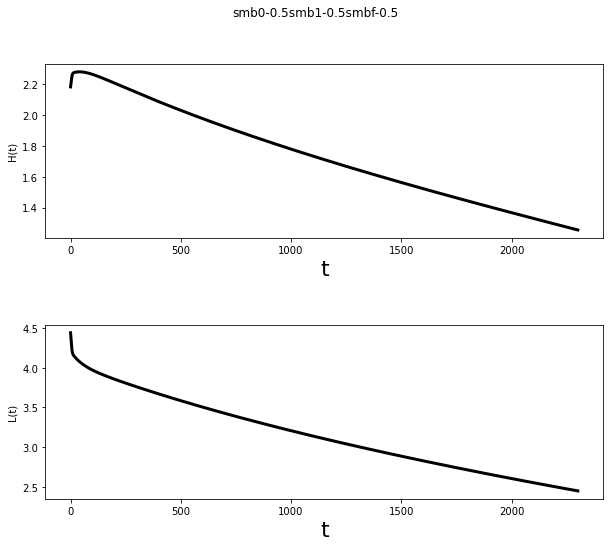

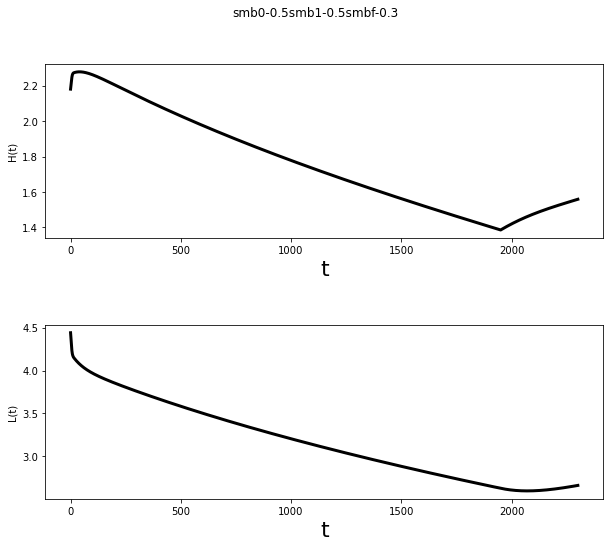

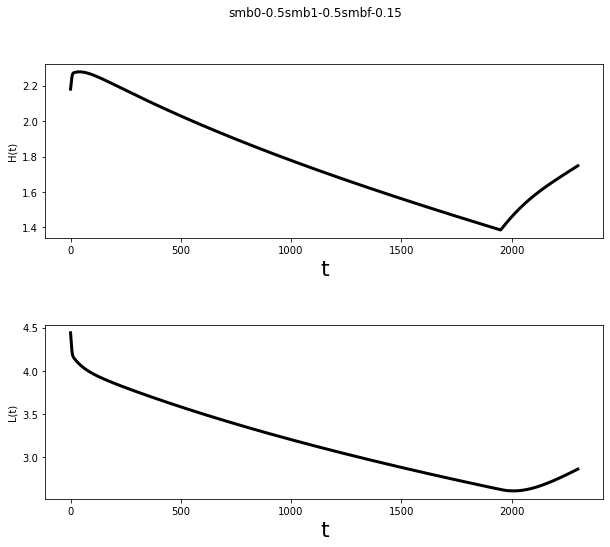

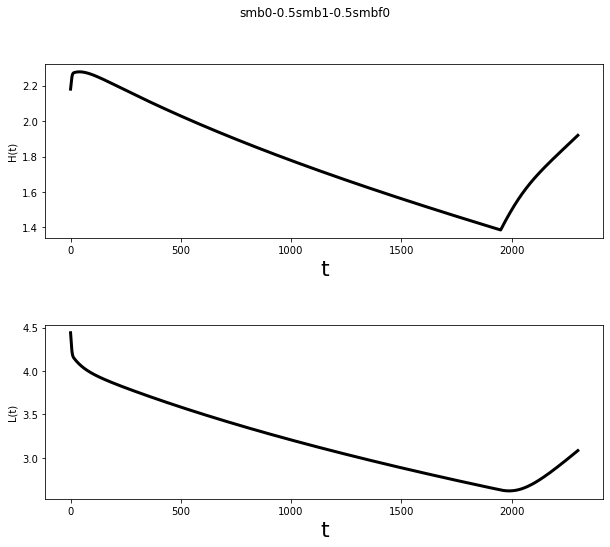

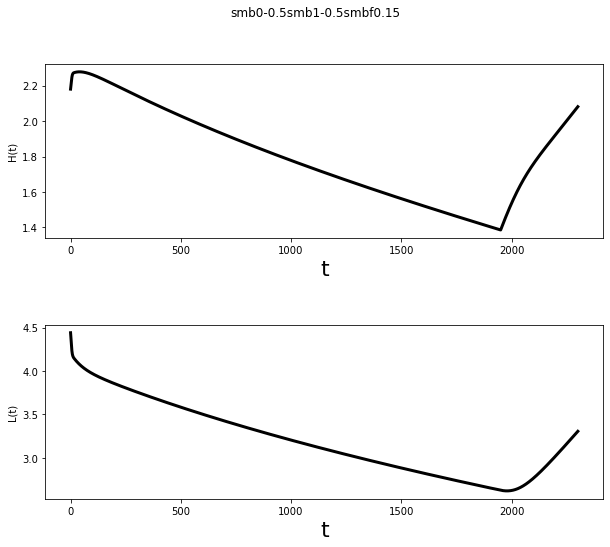

...

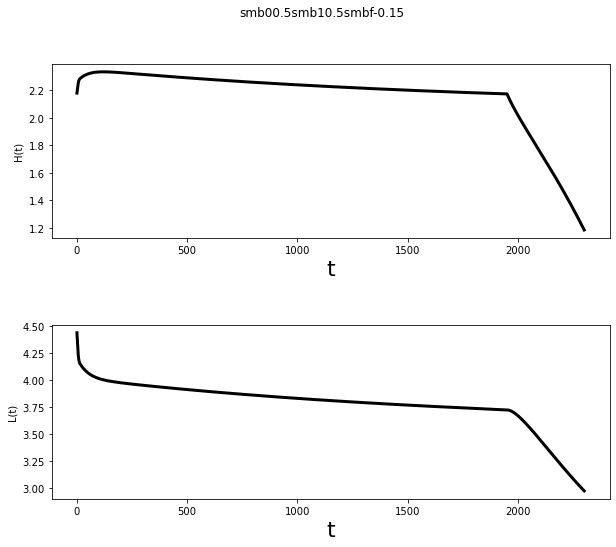

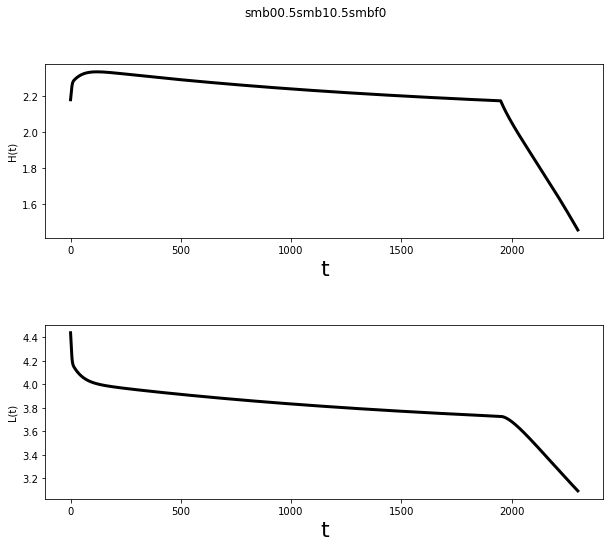

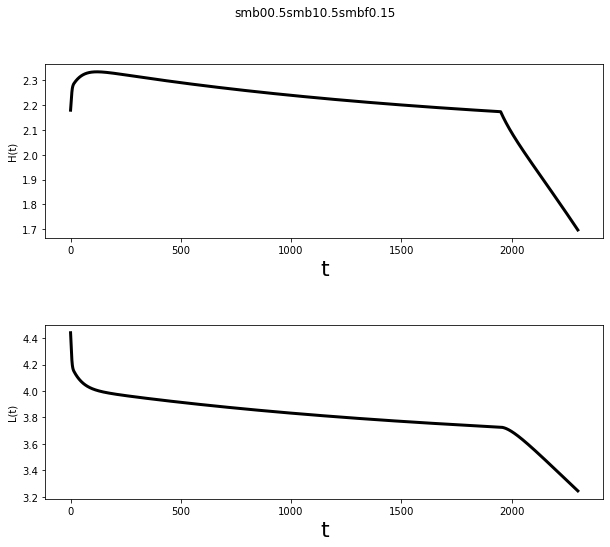

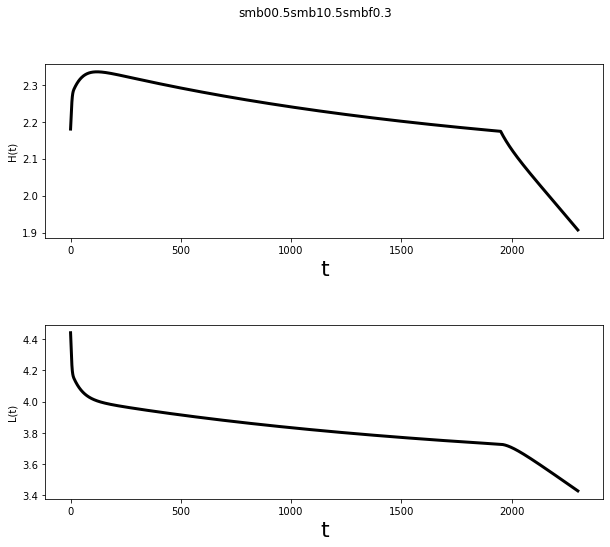

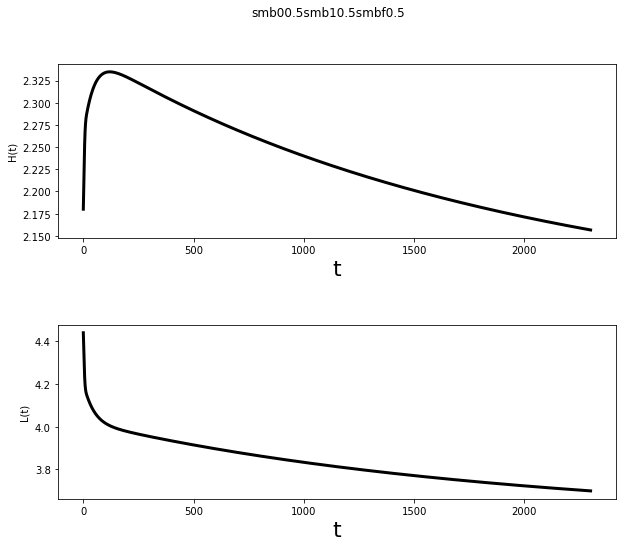

In [23]:
for l in range(len(smb_0d)):
    for m in range(len(smb_1d)):
        for n in range(len(smb_fd)):
            var = arr[0][0][0][l][m][n]
            nd = 2 #degrees of freedom (number of prognositic equations in model)
            # parameters
            smb0 = var[3]
            smb1 = var[4]
            smbf = var[5]
            t1 = var[1]
            gamma = 0.05
            omega = 8e-8
            #b0 = 0
            #bx = -0.001
            #sillmin = 430e3
            #sillmax = 440e3
            #sillslope = 0.01

            dt = 1
            tm = 2300
            nt = int(tm/dt)
            t = np.linspace(0,tm,nt+1)
            u0True = np.array([2.18,4.44]) # True initial conditions
            # first is H, second is L
            #np.random.seed(seed=1)
            sig_m_acc= 0.1  # standard deviation for accurate measurement noise
            sig_m_inacc= 0.07  # standard deviation for inaccurate measurement noise

            ind_m_inacc = np.linspace(200,1800,9).astype(int) #np.array([1000,1900])
            ind_m_acc = np.linspace(2001,2020,20).astype(int)
            ind_m = np.concatenate((ind_m_inacc,ind_m_acc))
            t_m = t[ind_m]
            nt_m = np.size(ind_m)
            sig_m =  np.zeros(nt+1)
            sig_m[ind_m_inacc] = sig_m_inacc
            sig_m[ind_m_acc] = sig_m_acc

            #time integration
            uTrue = np.zeros([nd,nt+1])
            uTrue[:,0] = u0True
            km = 0
            w = np.zeros([nd,nt_m])
            for k in range(nt):
                time = k*dt
                uTrue[:,k+1] = RK4(TwoStage_timedep,uTrue[:,k],dt,smb0,smb1,smbf,gamma,omega,time,t1,tm)
                if (km<nt_m) and (k+1==ind_m[km]):
                    w[:,km] = h(uTrue[:,k+1]) + np.random.normal(0,sig_m[k+1],[nd,])
                    km = km+1

            dft=pd.DataFrame(t.T, columns=['t'])
            df=pd.DataFrame(uTrue.T, columns=['H','L'])
            data1=df.join(dft)
            data=data1.set_index('t')
            data.to_csv(f"data_matrix_1/smb0{str(var[3])}smb1{str(var[4])}smbf{str(var[5])}.csv")
            fig, ax = plt.subplots(nrows=nd,ncols=1, figsize=(10,8))
            ax = ax.flat
            for k in range(nd):
                ax[k].plot(t,uTrue[k,:], label='True', linewidth = 3, color="black")
                ax[k].set_xlabel('t',fontsize=22)

            fig.suptitle(f"smb0{str(var[3])}smb1{str(var[4])}smbf{str(var[5])}")
            ax[0].set_ylabel('H(t)', labelpad=5)
            ax[1].set_ylabel('L(t)', labelpad=5)
            fig.subplots_adjust(hspace=0.5)
            plt.savefig(f'plots_data_matrix_1/smb0{str(var[3])}smb1{str(var[4])}smbf{str(var[5])}.png')

## Generating synthetic "truth" simulation

This section of code generates a truth simulation using the model and initial conditions for H and L.

Text(0, 0.5, 'L(t)')

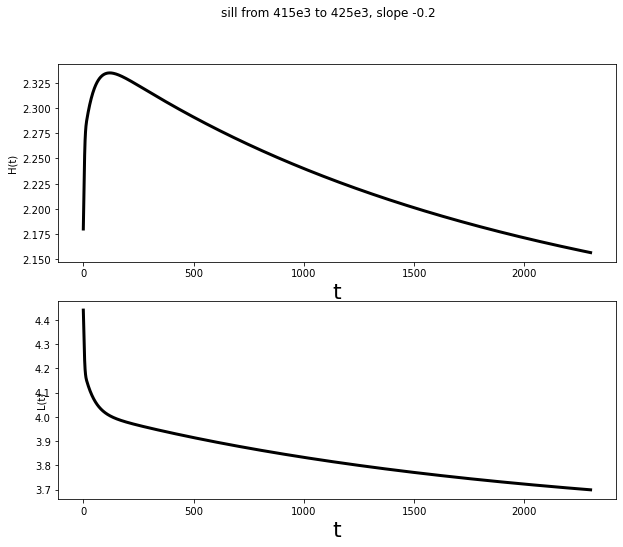

In [16]:
u0True = np.array([2.18,4.44]) # True initial conditions
# first is H, second is L
#np.random.seed(seed=1)
sig_m_acc= 0.1  # standard deviation for accurate measurement noise
sig_m_inacc= 0.07  # standard deviation for inaccurate measurement noise

ind_m_inacc = np.linspace(200,1800,9).astype(int) #np.array([1000,1900])
ind_m_acc = np.linspace(2001,2020,20).astype(int)
ind_m = np.concatenate((ind_m_inacc,ind_m_acc))
t_m = t[ind_m]
nt_m = np.size(ind_m)
sig_m =  np.zeros(nt+1)
sig_m[ind_m_inacc] = sig_m_inacc
sig_m[ind_m_acc] = sig_m_acc

#time integration
uTrue = np.zeros([nd,nt+1])
uTrue[:,0] = u0True
km = 0
w = np.zeros([nd,nt_m])
for k in range(nt):
    time = k*dt
    uTrue[:,k+1] = RK4(TwoStage_timedep,uTrue[:,k],dt,smb0,smb1,smbf,gamma,omega,time,t1,tm)
    if (km<nt_m) and (k+1==ind_m[km]):
        w[:,km] = h(uTrue[:,k+1]) + np.random.normal(0,sig_m[k+1],[nd,])
        km = km+1
        
fig, ax = plt.subplots(nrows=nd,ncols=1, figsize=(10,8))
ax = ax.flat
for k in range(nd):
    ax[k].plot(t,uTrue[k,:], label='True', linewidth = 3, color="black")
    ax[k].set_xlabel('t',fontsize=22)

fig.suptitle("sill from 415e3 to 425e3, slope -0.2")
ax[0].set_ylabel('H(t)', labelpad=5)
ax[1].set_ylabel('L(t)', labelpad=-12)
fig.subplots_adjust(hspace=0.5)

In [83]:
dft=pd.DataFrame(t.T, columns=['t'])
df=pd.DataFrame(uTrue.T, columns=['H','L'])
data1=df.join(dft)
data=data1.set_index('t')
var='_sill__415e3_to_425e3__slope_-0.2'
data.to_csv(f'data{var}.csv')

In [10]:
#save all "obs"
ind_m_all = ind_m
nt_m_all = nt_m
w_all = w
t_m_all = t_m
sig_m_all = sig_m

## Assimilation run: snapshot modern obs

This section of code generates a series of false initial conditions then uses it to generate false runs.

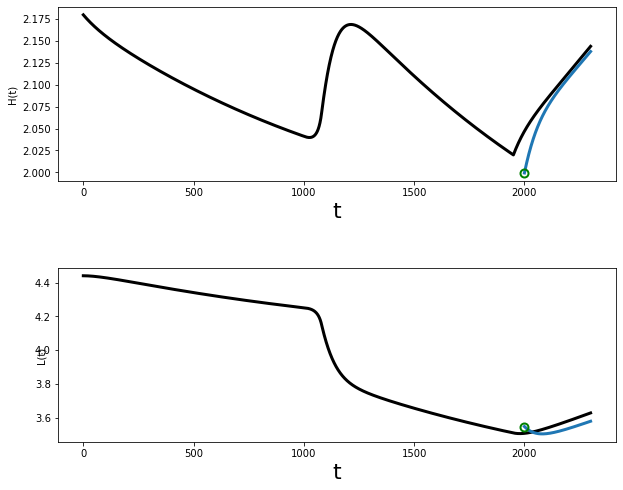

In [11]:
u0Snap = w_all[:,9] # wrong initial conditions
omega = 1.1*8e-8 #"wrong" parameter
#np.random.seed(seed=1)
sig_m_acc= 0.05  # standard deviation for accurate measurement noise
sig_m_inacc= 0.1  # standard deviation for accurate measurement noise

#time integration
ntsnap=300
tsnap = np.linspace(2000,2300,ntsnap+1)

uSnap = np.zeros([nd,ntsnap+1])
uSnap[:,0] = u0Snap

for k in range(ntsnap):
    time = tsnap[k]
    uSnap[:,k+1] = RK4(TwoStage_timedep,uSnap[:,k],dt,smb0,smb1,smbf,gamma,omega,time,t1,tm)
        
fig, ax = plt.subplots(nrows=nd,ncols=1, figsize=(10,8))
ax = ax.flat
for k in range(nd):
    ax[k].plot(t,uTrue[k,:], label='True', linewidth = 3, color="black")
    ax[k].plot(tsnap,uSnap[k,:], label='Snapshot', linewidth = 3)
    ax[k].plot(tsnap[0],uSnap[k,0], 'o', fillstyle='none', label='Observations', markersize = 8, markeredgewidth = 2, color = 'g')
    
    ax[k].set_xlabel('t',fontsize=22)

ax[0].set_ylabel('H(t)', labelpad=5)
ax[1].set_ylabel('L(t)', labelpad=-12)
fig.subplots_adjust(hspace=0.5) 

## Assimilation run: many modern obs

### Set params an "wrong" initial conditions and parameters

Sets parameters for wrong initial conditions and assimilation.

In [12]:
u0b = np.array([2.3,4.7]) #"wrong" initial conditions (initial condition of simulation)
#omega = 0.9*8e-8 #"wrong" parameter
# smb0 = 0.3
# smb1 = 0.2
smb0 = 0
smb1 = 0.15

sig_b= 0.1
B = sig_b**2*np.eye(nd) #placeholder until first filter update
Q = 0.0*np.eye(nd)

#time integration
ub = np.zeros([nd,nt+1])
ub[:,0] = u0b
ua = np.zeros([nd,nt+1])
ua[:,0] = u0b

n = nd #state dimension
m = nd #measurement dimension

# ensemble size 
N = 10
#initialize ensemble
uai = np.zeros([nd,N])
uae = np.zeros([nd,N,nt+1])
for i in range(N):
    uai[:,i] = u0b + np.random.multivariate_normal(np.zeros(n), B)
    
## which obs to assimilate
obsub = range(9,nt_m_all)
w = w_all[:,obsub]
ind_m = ind_m_all[obsub]
nt_m = np.size(ind_m)
t_m = t_m_all[obsub]
sig_m =  np.zeros(nt+1)
sig_m[ind_m_acc] = sig_m_acc

### Run ensemble with assimilation

Runs false models, then assimilate the data.

In [13]:
km = 0
for k in range(nt):
    time = k*dt
    # Forecast Step
    #background trajectory [without correction]
    ub[:,k+1] = RK4(TwoStage_timedep,ub[:,k],dt,smb0,smb1,smbf,gamma,omega,time,t1,tm)
    #EnKF trajectory [with correction at observation times]
    for i in range(N): # forecast ensemble
        uai[:,i] = RK4(TwoStage_timedep,uai[:,i],dt,smb0,smb1,smbf,gamma,omega,time,t1,tm) \
                 + np.random.multivariate_normal(np.zeros(n), Q)
        uae[:,i,k+1] = uai[:,i]

    # compute the mean of forecast ensemble
    ua[:,k+1] = np.mean(uai,1)
    # compute forecast error covariance matrix
    B = (1/(N-1)) * (uai - ua[:,k+1].reshape(-1,1)) @ (uai - ua[:,k+1].reshape(-1,1)).T

    if (km<nt_m) and (k+1==ind_m[km]):
        R = sig_m[k+1]**2*np.eye(nd) #covariance matrix for measurement noise

        # Analysis Step
        uai,B = EnKF(uai,w[:,km],h,Dh,R,B)
        # compute the mean of analysis ensemble
        ua[:,k+1] = np.mean(uai,1) 
        km = km+1

### Plot

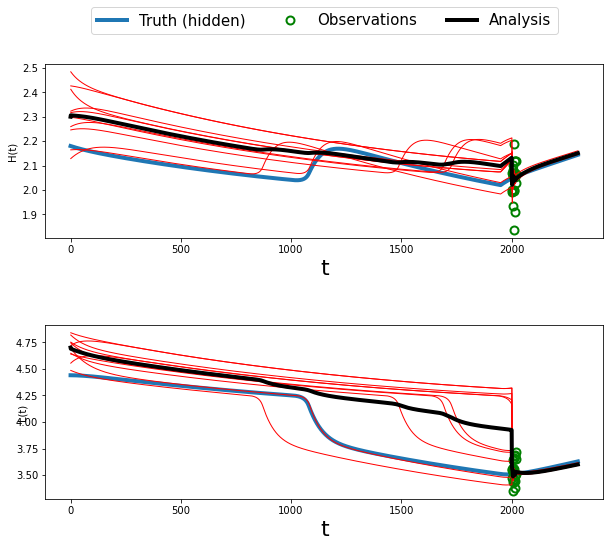

In [14]:
fig, ax = plt.subplots(nrows=nd,ncols=1, figsize=(10,8))
ax = ax.flat

for k in range(nd):
    ax[k].plot(t,uTrue[k,:], label='Truth (hidden)', linewidth = 4)
    #ax[k].plot(t,ub[k,:], ':', label='Background', linewidth = 3)
    ax[k].plot(t[ind_m],w[k,:], 'o', fillstyle='none', \
               label='Observations', markersize = 8, markeredgewidth = 2, color = 'g')
    ax[k].set_xlabel('t',fontsize=22)
    #ax[k].axvspan(0, tm_m, color='y', alpha=0.4, lw=0)
    for j in range(N):
        ax[k].plot(t[1:],uae[k,j,1:], '-', linewidth = 1, color='r')
    ax[k].plot(t,ua[k,:], '-', label='Analysis', linewidth = 4, color = 'k')

ax[0].legend(loc="center", bbox_to_anchor=(0.5,1.25),ncol =4,fontsize=15)

ax[0].set_ylabel('H(t)', labelpad=5)
ax[1].set_ylabel('L(t)', labelpad=-12)
#ax[2].set_ylabel('z(t)')
fig.subplots_adjust(hspace=0.5)

w_modern = w
uae_modern = uae
ua_modern = ua
t_modern = t
ind_m_modern = ind_m

## Assimilation run: many modern obs + paleo

### Set params an "wrong" initial conditions and parameters

In [15]:
u0b = np.array([2.3,4.7]) #"wrong" initial conditions (initial condition of simulation)
#omega = 0.9*8e-8 #"wrong" parameter
# smb0 = 0.3
# smb1 = 0.2
smb0 = 0
smb1 = 0.15

sig_b= 0.1
B = sig_b**2*np.eye(nd) #placeholder until first filter update
Q = 0.0*np.eye(nd)

#time integration
ub = np.zeros([nd,nt+1])
ub[:,0] = u0b
ua = np.zeros([nd,nt+1])
ua[:,0] = u0b

n = nd #state dimension
m = nd #measurement dimension

# ensemble size 
N = 10
#initialize ensemble
uai = np.zeros([nd,N])
uae = np.zeros([nd,N,nt+1])
for i in range(N):
    uai[:,i] = u0b + np.random.multivariate_normal(np.zeros(n), B)
    
## which obs to assimilate
w = w_all
ind_m = ind_m_all
nt_m = nt_m_all
t_m = t_m_all
sig_m =  sig_m_all

### Run ensemble with assimilation

In [16]:
km = 0
for k in range(nt):
    time = k*dt
    # Forecast Step
    #background trajectory [without correction]
    ub[:,k+1] = RK4(TwoStage_timedep,ub[:,k],dt,smb0,smb1,smbf,gamma,omega,time,t1,tm)
    #EnKF trajectory [with correction at observation times]
    for i in range(N): # forecast ensemble
        uai[:,i] = RK4(TwoStage_timedep,uai[:,i],dt,smb0,smb1,smbf,gamma,omega,time,t1,tm) \
                 + np.random.multivariate_normal(np.zeros(n), Q)
        uae[:,i,k+1] = uai[:,i]

    # compute the mean of forecast ensemble
    ua[:,k+1] = np.mean(uai,1)
    # compute forecast error covariance matrix
    B = (1/(N-1)) * (uai - ua[:,k+1].reshape(-1,1)) @ (uai - ua[:,k+1].reshape(-1,1)).T

    if (km<nt_m) and (k+1==ind_m[km]):
        R = sig_m[k+1]**2*np.eye(nd) #covariance matrix for measurement noise

        # Analysis Step
        uai,B = EnKF(uai,w[:,km],h,Dh,R,B)
        # compute the mean of analysis ensemble
        ua[:,k+1] = np.mean(uai,1) 
        km = km+1

### Plot

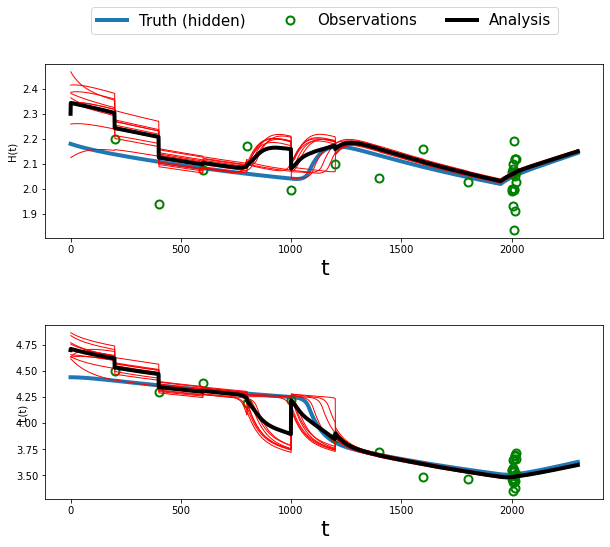

In [17]:
fig, ax = plt.subplots(nrows=nd,ncols=1, figsize=(10,8))
ax = ax.flat

for k in range(nd):
    ax[k].plot(t,uTrue[k,:], label='Truth (hidden)', linewidth = 4)
    #ax[k].plot(t,ub[k,:], ':', label='Background', linewidth = 3)
    ax[k].plot(t[ind_m],w[k,:], 'o', fillstyle='none', \
               label='Observations', markersize = 8, markeredgewidth = 2, color = 'g')
    ax[k].set_xlabel('t',fontsize=22)
    #ax[k].axvspan(0, tm_m, color='y', alpha=0.4, lw=0)
    for j in range(N):
        ax[k].plot(t[1:],uae[k,j,1:], '-', linewidth = 1, color='r')
    ax[k].plot(t,ua[k,:], '-', label='Analysis', linewidth = 4, color = 'k')

ax[0].legend(loc="center", bbox_to_anchor=(0.5,1.25),ncol =4,fontsize=15)

ax[0].set_ylabel('H(t)', labelpad=5)
ax[1].set_ylabel('L(t)', labelpad=-12)
#ax[2].set_ylabel('z(t)')
fig.subplots_adjust(hspace=0.5)

w_all = w
uae_all = uae
ua_all = ua
t_all = t

## Assimilation run: many modern obs + paleo + parameter estimation

### Set params and "wrong" initial conditions and parameters

In [18]:
def TwoStage_timedep_withparam(state,*args): #Robel et al. 2018 two-stage model
    
    Hnd, Lnd, Ond = state #Unpack the state vector
    f = np.zeros(3) #Derivatives
    
    smb0 = args[0]
    smb1 = args[1]
    smbf = args[2]
    gamma = args[3]
    #omega = args[4]
    time = args[4]
    t1 = args[5]
    tfinal = args[6]
#    b0 = args[3]
#    bx = args[4]
#    sillmin = args[5]
#    sillmax = args[6]
#    sillslope = args[7]

    b0 = 0
    bx = -0.001
    sillmin = 415e3
    sillmax = 425e3
    sillslope = 0.01
    
    rhow = 1028
    rhoi = 917
    n = 3
    beta = 4.75
    Lscale = 100e3
    Hscale = 1000
    Oscale = 10e-8
    
    H = Hnd*Hscale
    L = Lnd*Lscale
    omega = Ond*Oscale
    
    if time < t1:
        smb = smb0 + (smb1-smb0)*time/t1
    else:
        smb = smb1 + (smbf-smb1)*time/(tfinal-t1) 
    
    hg = -(rhow/rhoi)*bedtopo(L,b0,bx,sillmin,sillmax,sillslope)
    Q = gamma * (H**(2*n + 1))/(L**n)
    Qg = omega * (hg**beta)
    
    f[0] = (smb - (Qg/L) - (H/(hg*L))*(Q-Qg))/Hscale
    f[1] = (Q-Qg)/hg/Lscale
    f[2] = 0
    return f 

In [19]:
# Observation operators
def h(u):
    w = u[0:2]
    return w

def Dh(u):
    n = len(u)
    D = np.hstack((np.eye(n),np.zeros((n,1))))
    return D

In [20]:
u0b = np.array([2.25,4.6,omega/10e-8]) #"wrong" initial conditions (initial condition of simulation)
nd=3;
#omega = 0.9*8e-8 #"wrong" parameter
# smb0 = 0.3
# smb1 = 0.2
smb0 = 0
smb1 = 0.15

sig_b= 0.1
B = sig_b**2*np.eye(nd) #placeholder until first filter update
Q = 0.0*np.eye(nd)

#time integration
ub = np.zeros([nd,nt+1])
ub[:,0] = u0b
ua = np.zeros([nd,nt+1])
ua[:,0] = u0b

n = nd #state dimension
m = 2 #measurement dimension

# ensemble size 
N = 10
#initialize ensemble
uai = np.zeros([nd,N])
uae = np.zeros([nd,N,nt+1])
for i in range(N):
    uai[:,i] = u0b + np.random.multivariate_normal(np.zeros(n), B)
    
## which obs to assimilate
w = w_all
ind_m = ind_m_all
nt_m = nt_m_all
t_m = t_m_all
sig_m =  sig_m_all

### Run ensemble with assimilation

In [21]:
km = 0
for k in range(nt):
    time = k*dt
    # Forecast Step
    #background trajectory [without correction]
    ub[:,k+1] = RK4(TwoStage_timedep_withparam,ub[:,k],dt,smb0,smb1,smbf,gamma,time,t1,tm)
    #EnKF trajectory [with correction at observation times]
    for i in range(N): # forecast ensemble
        uai[:,i] = RK4(TwoStage_timedep_withparam,uai[:,i],dt,smb0,smb1,smbf,gamma,time,t1,tm) \
                 + np.random.multivariate_normal(np.zeros(n), Q)
        uae[:,i,k+1] = uai[:,i]

    # compute the mean of forecast ensemble
    ua[:,k+1] = np.mean(uai,1)
    # compute forecast error covariance matrix
    B = (1/(N-1)) * (uai - ua[:,k+1].reshape(-1,1)) @ (uai - ua[:,k+1].reshape(-1,1)).T

    if (km<nt_m) and (k+1==ind_m[km]):
        R = sig_m[k+1]**2*np.eye(m) #covariance matrix for measurement noise

        # Analysis Step
        uai,B = EnKF(uai,w[:,km],h,Dh,R,B)
        # compute the mean of analysis ensemble
        ua[:,k+1] = np.mean(uai,1) 
        km = km+1

### Plot

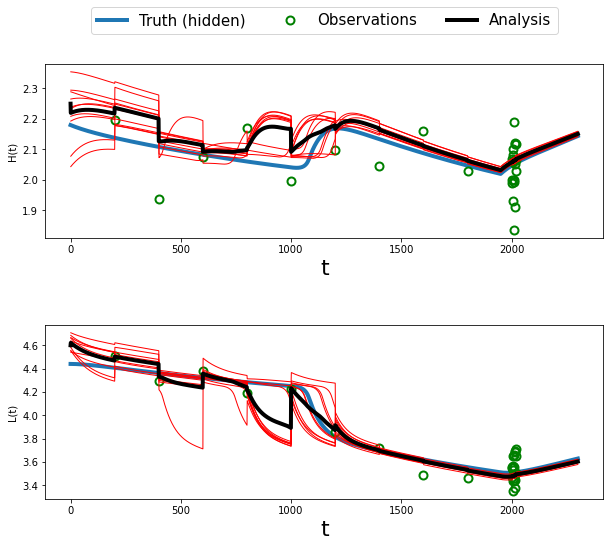

In [22]:
fig, ax = plt.subplots(nrows=nd-1,ncols=1, figsize=(10,8))
ax = ax.flat

for k in range(nd-1):
    ax[k].plot(t,uTrue[k,:], label='Truth (hidden)', linewidth = 4)
    #ax[k].plot(t,ub[k,:], ':', label='Background', linewidth = 3)
    ax[k].plot(t[ind_m],w[k,:], 'o', fillstyle='none', \
               label='Observations', markersize = 8, markeredgewidth = 2, color = 'g')
    ax[k].set_xlabel('t',fontsize=22)
    #ax[k].axvspan(0, tm_m, color='y', alpha=0.4, lw=0)
    for j in range(N):
        ax[k].plot(t[1:],uae[k,j,1:], '-', linewidth = 1, color='r')
    ax[k].plot(t,ua[k,:], '-', label='Analysis', linewidth = 4, color = 'k')

ax[0].legend(loc="center", bbox_to_anchor=(0.5,1.25),ncol =4,fontsize=15)

ax[0].set_ylabel('H(t)', labelpad=5)
ax[1].set_ylabel('L(t)', labelpad=5)
#ax[2].set_ylabel('z(t)')
fig.subplots_adjust(hspace=0.5)

w_param = w
uae_param = uae
ua_param = ua
t_param = t

## Plot all cases together

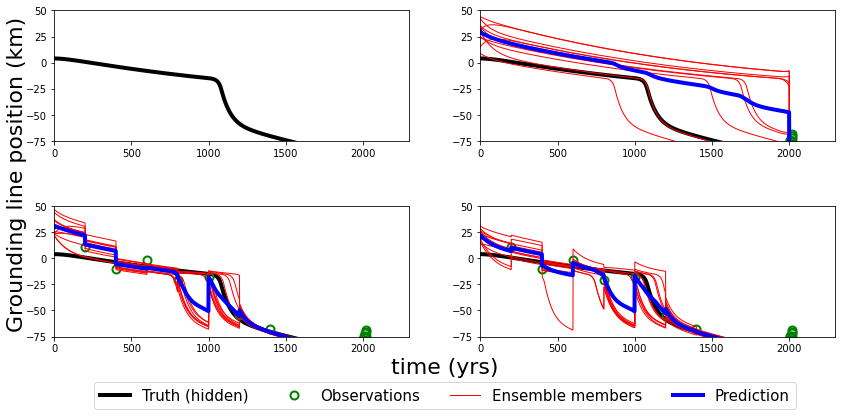

In [23]:
fig, ax = plt.subplots(nrows=2,ncols=2, figsize=(14,6))
ax = ax.flat
k=1
ax[0].plot(t,uTrue[k,:]*100 - 440, label='True', linewidth = 4, color="black")
ax[0].plot(tsnap,uSnap[k,:]*100 - 440, label='Prediction', linewidth = 4, color="blue")
ax[0].plot(tsnap[0],uSnap[k,0]*100 - 440, 'o', fillstyle='none', label='Observations', markersize = 8, markeredgewidth = 2, color = 'g')
#ax[0].set_ylabel('Grounding line position (km)')
#ax[0].set_title('Snapshot initialization with single obs.',fontsize=22)
ax[0].set_xlim(0,2300)
ax[0].set_ylim(-75,50)
fig.subplots_adjust(hspace=0.5) 

#modern obs assim
ax[1].plot(t_modern,uTrue[k,:]*100 - 440, label='Truth (hidden)', linewidth = 4, color="black")
ax[1].plot(t_modern[ind_m_modern],w_modern[k,:]*100 - 440, 'o', fillstyle='none', label='Observations', markersize = 8, markeredgewidth = 2, color = 'g')
for j in range(N):
    ax[1].plot(t_modern[1:],uae_modern[k,j,1:]*100 - 440, '-', linewidth = 1, color='r')
ax[1].plot(t_modern,ua_modern[k,:]*100 - 440, '-', label='Prediction', linewidth = 4, color="blue")
#ax[1].set_ylabel('Grounding line position (km)')
#ax[1].set_title('EKF assimilating modern obs.')
ax[1].set_xlim(0,2300)
ax[1].set_ylim(-75,50)
fig.subplots_adjust(hspace=0.5) 

#all obs assim
ax[2].plot(t,uTrue[k,:]*100 - 440, label='Truth (hidden)', linewidth = 4, color="black")
ax[2].plot(t_all[ind_m],w_all[k,:]*100 - 440, 'o', fillstyle='none', label='Observations', markersize = 8, markeredgewidth = 2, color = 'g')
#ax[2].set_xlabel('t',fontsize=22)
for j in range(N):
    ax[2].plot(t_all[1:],uae_all[k,j,1:]*100 - 440, '-', linewidth = 1, color='r')
ax[2].plot(t_all[1:],uae_all[k,N-1,1:]*100 - 440, '-', linewidth = 1, color='r', label="Ensemble members")
ax[2].plot(t_all,ua_all[k,:]*100 - 440, '-', label='Prediction', linewidth = 4, color="blue")
#ax[2].set_ylabel('Grounding line position (km)')
#ax[2].set_title('EKF assimilating modern/paleo obs.')
ax[2].set_xlim(0,2300)
ax[2].set_ylim(-75,50)
fig.subplots_adjust(hspace=0.5) 

#all obs assim
ax[3].plot(t,uTrue[k,:]*100 - 440, label='Truth (hidden)', linewidth = 4, color="black")
ax[3].plot(t_all[ind_m],w_param[k,:]*100 - 440, 'o', fillstyle='none', label='Observations', markersize = 8, markeredgewidth = 2, color = 'g')
#ax[3].set_xlabel('t',fontsize=22)
for j in range(N):
    ax[3].plot(t_all[1:],uae_param[k,j,1:]*100 - 440, '-', linewidth = 1, color='r')
ax[3].plot(t_all[1:],uae_param[k,N-1,1:]*100 - 440, '-', linewidth = 1, color='r', label="Ensemble members")
ax[3].plot(t_all,ua_param[k,:]*100 - 440, '-', label='Prediction', linewidth = 4, color="blue")
#ax[3].set_xlabel('time (years)',fontsize=22)
#ax[3].set_ylabel('Grounding line position (km)')
#ax[3].set_title('EKF assimilating modern/paleo obs. + parameter estimation')
ax[3].set_xlim(0,2300)
ax[3].set_ylim(-75,50)
fig.subplots_adjust(hspace=0.5) 

fig.add_subplot(111, frame_on=False)
plt.tick_params(labelcolor="none", bottom=False, left=False)

plt.xlabel("time (yrs)", fontsize=22)
plt.ylabel("Grounding line position (km)", fontsize=22)

ax[3].legend(loc="center", bbox_to_anchor=(-0.1,-0.45),ncol =4,fontsize=15)